<center><font size = "10"> Week 9 - Cells in Space  <center>
<center><font size = "8">Home work<center>

<font size = "3">Please, write your group number and the names and surnames of the group members here
<br>Group number: 7
<br>Group member1: Joe Tharayil
<br>Group member2: Kiyarash Farivar

## Ex1. Placing cells in a cubic volume

<font size='3'>Define a cubic volume with the following dimensions: x = (2000, 5000), y = (2000, 5000), z = (-1000, 2000). Place the five morphologies assigned to your group (used in week2 and week7) in random positions inside the cube. Visualize the cells in the cube in three different planes: xy, xz and yz. [1 pt]

In [20]:
# Useful functions
def shift_morphology(morph,shift):
    morph.soma.points[:,[0,1,2]] += shift
    for n in morph.neurites:
        n.points[:,[0,1,2]] += shift

def center_morphology(morph):
    center = morph.soma.center.copy()
    shift_morphology(morph,-center)
    
def rotz(theta):
    radtheta = theta * np.pi / 180.0 # in radians
    R = np.array([[np.cos(radtheta),-np.sin(radtheta),0],
                  [np.sin(radtheta),np.cos(radtheta),0],
                  [0,0,1]])
    return R

def rotate_morphology(morph,R):
    morph.soma.points[:,[0,1,2]] = R.dot(morph.soma.points[:,[0,1,2]].T).T
    for n in morph.neurites:
        n.points[:,[0,1,2]] = R.dot(n.points[:,[0,1,2]].T).T    

def align_morphology_Y(morph,axis):
    # Rotation matrix that aligns the Y axis [0,1,0] to an arbitrary vector b (other than Y or -Y)
    # From https://math.stackexchange.com/a/476311
    a = np.array([0,1,0])

    b = np.array(axis) # target axis
    b = b / np.linalg.norm(b) # make unit norm

    v = np.cross(a,b)     # a x b
    s = np.linalg.norm(v) # ||v|| = sin(theta)
    c = a.dot(b)          # a . b = cos(theta)

    # Skew-symmetric cross-product matrix
    V = np.zeros((3,3))
    V[0,1] = -v[2]
    V[1,0] =  v[2]
    V[0,2] =  v[1]
    V[2,0] = -v[1]
    V[1,2] = -v[0]
    V[2,1] =  v[0]

    # Rotation matrix
    R = np.diag((1.0,1.0,1.0))
    R += V
    R += V.dot(V) * (1.0 - c) / (s * s)

    # Test
    if not np.max(R.dot(a) - b) < 1E-12:
        raise ValueError('Matrix not good!')
    
    # Rotate morphology
    rotate_morphology(morph,R)
    
def align_morphology_X(morph,axis):
    # Rotation matrix that aligns the Y axis [0,1,0] to an arbitrary vector b (other than Y or -Y)
    # From https://math.stackexchange.com/a/476311
    a = np.array([1,0,0])

    b = np.array(axis) # target axis
    b = b / np.linalg.norm(b) # make unit norm

    v = np.cross(a,b)     # a x b
    s = np.linalg.norm(v) # ||v|| = sin(theta)
    c = a.dot(b)          # a . b = cos(theta)

    # Skew-symmetric cross-product matrix
    V = np.zeros((3,3))
    V[0,1] = -v[2]
    V[1,0] =  v[2]
    V[0,2] =  v[1]
    V[2,0] = -v[1]
    V[1,2] = -v[0]
    V[2,1] =  v[0]

    # Rotation matrix
    R = np.diag((1.0,1.0,1.0))
    R += V
    R += V.dot(V) * (1.0 - c) / (s * s)

    # Test
    if not np.max(R.dot(a) - b) < 1E-12:
        raise ValueError('Matrix not good!')
    
    # Rotate morphology
    rotate_morphology(morph,R)

# Poorman's plotting of morphologies
def plot_morphology(morph,color = None,plane = 'XY',somaOnly = False):
    colors = ['','','black','blue','red','green'] # colors for: soma, axon, basal, apical
    planes = { 'XY': [0,1], 'XZ': [0,2], 'YZ': [1,2], 'YX': [1,0], 'ZX': [2,0], 'ZY': [2,1] }
    if color is not None:
        colors = ['','','black',color,color,color]
    if not somaOnly:
        for n in morph.neurites:
            pts = n.points[:,[0,1,2]]
            plt.scatter(pts[:,planes[plane][0]],pts[:,planes[plane][1]],s=1,c=colors[n.type.value],marker='.')
    pts = morph.soma.center
    plt.scatter(pts[planes[plane][0]],pts[planes[plane][1]],c=colors[nm.NeuriteType.soma.value],marker='D')

def plot_morphologies(morphlist,plane = 'XY',somaOnly = False):
    colors = ['red','green','blue','magenta','cyan','yellow','orange','purple','brown']
    if len(morphlist) is 1:
        colors = [None]
    if somaOnly:
        colors = ['black' for i in range(0,len(morphlist))]
    fig = plt.figure()
    fig.suptitle(plane)
    for i,m in enumerate(morphlist):
        plot_morphology(m,colors[i % len(colors)],plane = plane,somaOnly = somaOnly)
        
def morph_get_all_points(morph):
    pts = morph.soma.center.copy()
    for n in morph.neurites:
        pts = np.vstack((pts,n.points[:,[0,1,2]]))
    return pts


In [2]:
import numpy as np
rng = np.random.default_rng()

N = 5 # number of positions
volume = [[2000,5000],[2000,5000],[-1000,2000]] # volume bounds [um]

# get positions in required ranges
pos = rng.random((N,3)) # in [0,1)
for i,x in enumerate(volume):
    pos[:,i] = (x[1] - x[0]) * pos[:,i] + x[0]

In [47]:
import neurom as nm
cells = ['02','04','08','09','10']
morph_files = ['../week7/morphs/morph_'+cell+'.swc' for cell in cells]
morphs = [nm.load_neuron(x) for x in morph_files]

In [48]:
for i,m in enumerate(morphs):
    center_morphology(m)
    shift_morphology(m,pos[i])
cells_inh = [morphs[1],morphs[2]]
cells_exc = [morphs[0],morphs[3],morphs[4]]

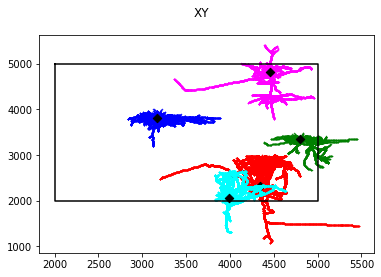

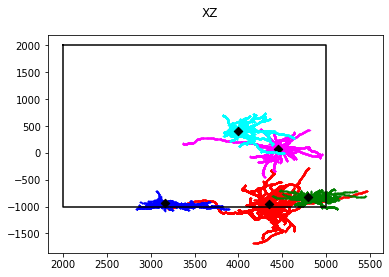

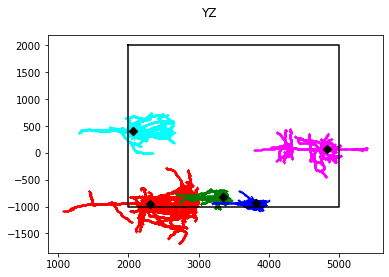

In [5]:
import matplotlib.pyplot as plt
planes = ['XY','XZ','YZ']
ax = [[0,1],[0,2],[1,2]]
for i,Plane in enumerate(planes):
    # Plot whole morphologies
    plot_morphologies(morphs,plane=Plane)
    # Plot volume containing somas
    plt.plot((volume[ax[i][0]][0],volume[ax[i][0]][1],volume[ax[i][0]][1],volume[ax[i][0]][0],volume[ax[i][0]][0]),
             (volume[ax[i][1]][1],volume[ax[i][1]][1],volume[ax[i][1]][0],volume[ax[i][1]][0],volume[ax[i][1]][1]),c='black')

## Ex2. Cells rotation

<font size='3'>Compute a 2D rotation along the z axis on the inhibitory cells from your data set, the rotation angles should be: 90°, 180° and 270°. Plot the reults in xy plane. Compute a 3D rotation to aling the pyramidal cells x axis with the vector (2,1,5). [1.5 pts]

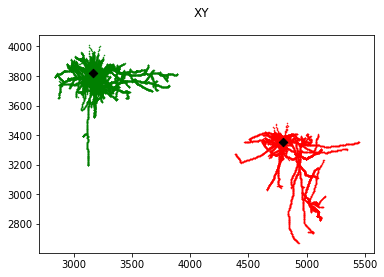

In [40]:
plot_morphologies(cells_inh)

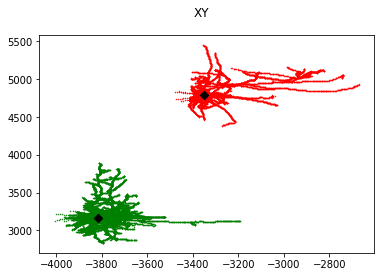

In [43]:

#for R in Rlist:
rotatedMorphs = []
#    print(R)
for cell in cells_inh: 
    newCell = cell
    rotate_morphology(newCell,Rlist[0])
    rotatedMorphs.append(newCell)

plot_morphologies(rotatedMorphs)
    

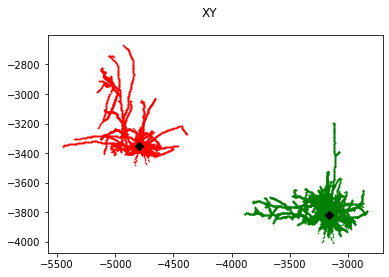

In [46]:
rotatedMorphs = []
#    print(R)
for cell in cells_inh: 
    newCell = cell
    rotate_morphology(newCell,Rlist[1])
    rotatedMorphs.append(newCell)

plot_morphologies(rotatedMorphs)

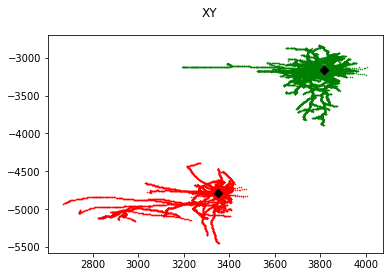

In [49]:
rotatedMorphs = []
#    print(R)
for cell in cells_inh: 
    newCell = cell
    rotate_morphology(newCell,Rlist[2])
    rotatedMorphs.append(newCell)

plot_morphologies(rotatedMorphs)

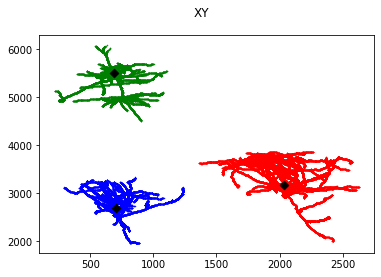

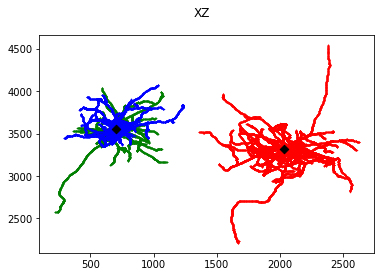

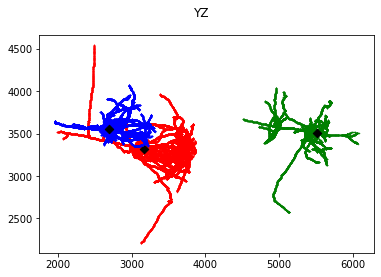

In [21]:
for cell in cells_exc:
    align_morphology_X(cell,np.array([2.,1.,5.]))
    
plot_morphologies(cells_exc,plane = 'XY')

plot_morphologies(cells_exc,plane = 'XZ')

plot_morphologies(cells_exc,plane = 'YZ')

## Ex3. Placing cells in a sphere

<font size='3'>Define a sphere with radious 2000 µm and centered in (200, 150, 300). Define 5 random points inside the sphere and place your 5 cells in random positions as it is done in tutorial 03. [1 pt]

In [5]:
N = 5 # number of positions
center = [200,150,300] # um
radius = 2000 # um

# get positions in sphere
# NOTE: we must use normal sampling to get uniform points
pos = np.random.randn(3, N)
pos /= np.linalg.norm(pos, axis = 0)
pos = pos.T

# Save normals
normals = pos.copy()

# Scale and translate
pos *= radius
pos += center

In [6]:
for i,m in enumerate(morphs):
    center_morphology(m)
    align_morphology_Y(m,normals[i])
    shift_morphology(m,pos[i])

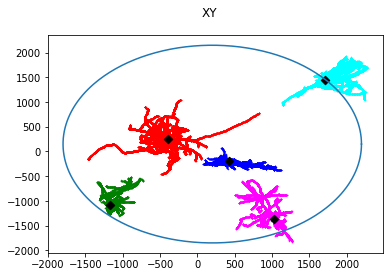

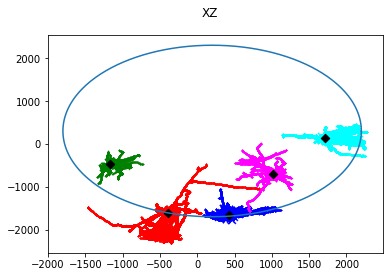

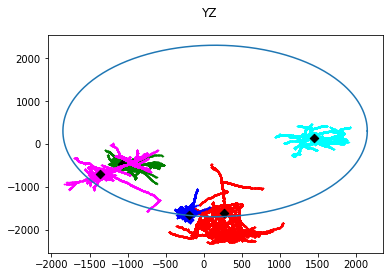

In [8]:
# Visualize in all three planes
import matplotlib.pyplot as plt
plot_morphologies(morphs,plane = 'XY')
# Plot sphere
angles = np.linspace(0,2.0 * np.pi,360)
xp = center[0] + radius * np.cos(angles)
yp = center[1] + radius * np.sin(angles)
plt.plot(xp,yp)

plot_morphologies(morphs,plane = 'XZ')
# Plot sphere
angles = np.linspace(0,2.0 * np.pi,360)
xp = center[0] + radius * np.cos(angles)
yp = center[2] + radius * np.sin(angles)
plt.plot(xp,yp)

plot_morphologies(morphs,plane = 'YZ')
# Plot sphere
angles = np.linspace(0,2.0 * np.pi,360)
xp = center[1] + radius * np.cos(angles)
yp = center[2] + radius * np.sin(angles)
plt.plot(xp,yp)

## Ex4. Placing cells in a cylinder

<font size='3'>Define a cylinder of radious 1000 µm and height 3000 µm. Define 5 random points inside the cilidier to place your cells. Consider that the pyramidal cells should have their y axes aligned with the cilinder vertical axes. Two of the pyramidal cells should have their apical dendrites facing up and the other should have its apical dendrites facing down. No rotating or oriented rules have to be applied to the inhibitory cells. Show the result in a 3D plot. [2.5 pts]

In [4]:
# Useful functions
def shift_morphology(morph,shift):
    morph.soma.points[:,[0,1,2]] += shift
    for n in morph.neurites:
        n.points[:,[0,1,2]] += shift

def center_morphology(morph):
    center = morph.soma.center.copy()
    shift_morphology(morph,-center)

def rotate_morphology(morph,R):
    morph.soma.points[:,[0,1,2]] = R.dot(morph.soma.points[:,[0,1,2]].T).T
    for n in morph.neurites:
        n.points[:,[0,1,2]] = R.dot(n.points[:,[0,1,2]].T).T    

def align_morphology_Y(morph,axis):
    # Rotation matrix that aligns the Y axis [0,1,0] to an arbitrary vector b (other than Y or -Y)
    # From https://math.stackexchange.com/a/476311
    a = np.array([0,1,0])

    b = np.array(axis) # target axis
    b = b / np.linalg.norm(b) # make unit norm

    v = np.cross(a,b)     # a x b
    s = np.linalg.norm(v) # ||v|| = sin(theta)
    c = a.dot(b)          # a . b = cos(theta)

    # Skew-symmetric cross-product matrix
    V = np.zeros((3,3))
    V[0,1] = -v[2]
    V[1,0] =  v[2]
    V[0,2] =  v[1]
    V[2,0] = -v[1]
    V[1,2] = -v[0]
    V[2,1] =  v[0]

    # Rotation matrix
    R = np.diag((1.0,1.0,1.0))
    R += V
    R += V.dot(V) * (1.0 - c) / (s * s)

    # Test
    if not np.max(R.dot(a) - b) < 1E-12:
        raise ValueError('Matrix not good!')
    
    # Rotate morphology
    rotate_morphology(morph,R)

# Poorman's plotting of morphologies
def plot_morphology(morph,color = None,plane = 'XY',somaOnly = False):
    colors = ['','','black','blue','red','green'] # colors for: soma, axon, basal, apical
    planes = { 'XY': [0,1], 'XZ': [0,2], 'YZ': [1,2], 'YX': [1,0], 'ZX': [2,0], 'ZY': [2,1] }
    if color is not None:
        colors = ['','','black',color,color,color]
    if not somaOnly:
        for n in morph.neurites:
            pts = n.points[:,[0,1,2]]
            plt.scatter(pts[:,planes[plane][0]],pts[:,planes[plane][1]],s=1,c=colors[n.type.value],marker='.')
    pts = morph.soma.center
    plt.scatter(pts[planes[plane][0]],pts[planes[plane][1]],c=colors[nm.NeuriteType.soma.value],marker='D')

def plot_morphologies(morphlist,plane = 'XY',somaOnly = False):
    colors = ['red','green','blue','magenta','cyan','yellow','orange','purple','brown']
    if len(morphlist) is 1:
        colors = [None]
    if somaOnly:
        colors = ['black' for i in range(0,len(morphlist))]
    fig = plt.figure()
    fig.suptitle(plane)
    for i,m in enumerate(morphlist):
        plot_morphology(m,colors[i % len(colors)],plane = plane,somaOnly = somaOnly)

def morph_get_all_points(morph):
    pts = morph.soma.center.copy()
    for n in morph.neurites:
        pts = np.vstack((pts,n.points[:,[0,1,2]]))
    return pts

In [10]:
# import
%matplotlib inline

import matplotlib.pyplot as plt
import neurom as nm
import numpy as np

In [11]:
#read files
path = '../week7/morphs/'

inhib_morph_files = ['morph_08.swc','morph_04.swc']
excit_morph_files = ['morph_02.swc', 'morph_09.swc', 'morph_10.swc']

morph_files = inhib_morph_files + excit_morph_files

morphs = [nm.load_neuron(path+x) for x in morph_files]

In [12]:
# define random points
# cylinder has center of bottom circle at (0,0,0)

N = 5

# sample z from uniform 0 to 3000
z = np.random.default_rng().uniform(low=0, high=3000, size=(N,1))

# get x and y from the normal dist
xy = np.random.default_rng().normal(size=(N,2))
# normalize
xy = xy/ np.linalg.norm(xy, axis = 1)[:, np.newaxis]
#scale
xy *= 1000 

# join the dimensions
pts = np.concatenate((xy,z), axis=1)

# get normals
normals = pts/ np.linalg.norm(pts, axis = 1)[:, np.newaxis]

In [13]:
# center all cells, put all cells in their random locations (align and shift)
new_y = np.array([0,0,1])
for i,m in enumerate(morphs):
    center_morphology(m)
    if i==3: # oriante neuron 3's apical down 
        new_y = np.array([0,0,-1])
    align_morphology_Y(m,new_y)
    shift_morphology(m,pts[i])
    # reset new_y
    new_y = np.array([0,0,1])

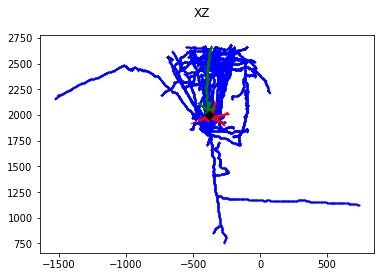

In [14]:
plot_morphologies([morphs[2]],plane = 'XZ')

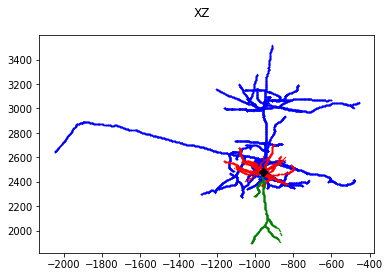

In [15]:
plot_morphologies([morphs[3]],plane = 'XZ')

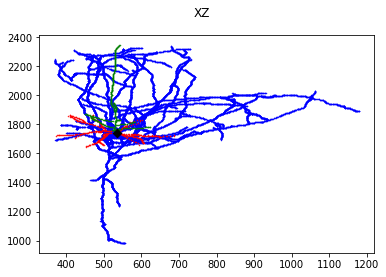

In [16]:
plot_morphologies([morphs[4]],plane = 'XZ')

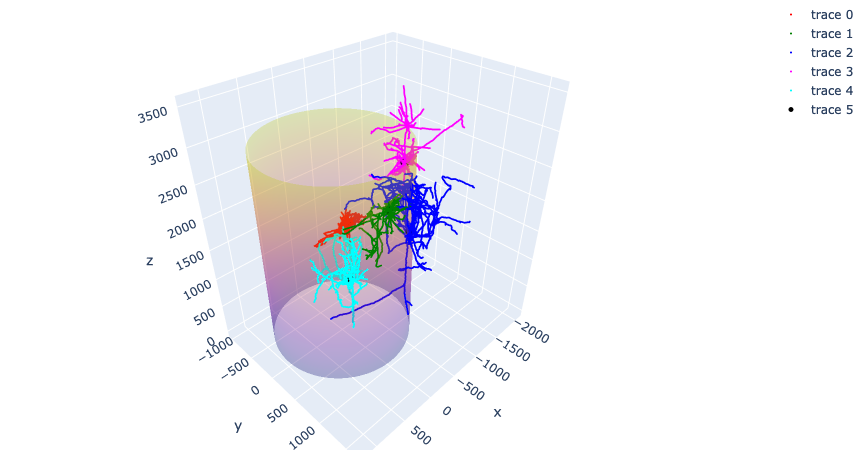

In [17]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

colors = ['red','green','blue','magenta','cyan','yellow','orange','purple','brown']

data = []
for i,m in enumerate(morphs):
    pts = morph_get_all_points(m)
    # Configure the trace.
    trace = go.Scatter3d(
        x=pts[:,0],  # <-- Put your data instead
        y=pts[:,1],  # <-- Put your data instead
        z=pts[:,2],  # <-- Put your data instead
        mode='markers',
        marker={
            'size': 1,
            'opacity': 1.0,
            'color': colors[i]
        }
    )
    data.append(trace)

# Overimpose somas
somas = np.array([m.soma.center for m in morphs])
trace = go.Scatter3d(
    x=somas[:,0],  # <-- Put your data instead
    y=somas[:,1],  # <-- Put your data instead
    z=somas[:,2],  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 5,
        'opacity': 1.0,
        'color': 'black'
    }
)
data.append(trace)


# plot cylinder
radius = 1000
theta = np.linspace(0,2*np.pi,100)
x = np.outer(np.cos(theta),np.ones(100))
y = np.outer(np.sin(theta),np.ones(100))

height = 3000
h = np.linspace(0,3000,100)
z = np.outer(np.ones(100), h)  # note this is 2d now

trace = go.Surface(
    x=radius * x ,
    y=radius * y ,
    z= z ,
    opacity = 0.3,
    showscale = False
)
data.append(trace)

    
# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)


In [19]:
radius = 1000 
theta = np.linspace(0,2*np.pi,100)
x = np.outer(np.cos(theta),np.ones(100))
y = np.outer(np.sin(theta),np.ones(100))

height = 3000
h = np.linspace(0,3000,100)
z = np.outer(np.ones(100), h)  # note this is 2d now